In [2]:
import requests
import os
import pandas as pd
import numpy as np
import tweepy
from tweepy import OAuthHandler
import json
from timeit import default_timer as timer
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image 
from io import BytesIO

In [3]:
folder = 'weRateDog'
if not os.path.exists(folder):
    os.makedirs(folder)
url = ' https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)

In [4]:
response

<Response [200]>

In [5]:
with open(os.path.join(folder,url.split('/')[-1]), mode = 'wb') as file:
    file.write(response.content)

In [6]:
os.listdir(folder)

['.ipynb_checkpoints', 'image-predictions.tsv']

In [7]:
imgPredit_df = pd.read_csv('weRateDog/image-predictions.tsv', sep= '\t')

In [8]:
imgPredit_df

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


In [18]:
df_twitterE = pd.read_csv('twitter-archive-enhanced (1).csv')
df_twitterE

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None


In [9]:
# Query Twitter API for each tweet in the Twitter archive and save JSON in a text file
consumer_key = '***************************************'
consumer_secret = '***************************************'
access_token = '***************************************'
access_secret = '***************************************'
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)
api = tweepy.API(auth)

In [19]:
tweet_id_unique = np.union1d(imgPredit_df.tweet_id.unique(), df_twitterE.tweet_id.unique())
tweet_id_unique.size

2356

In [11]:
api = tweepy.API(auth, wait_on_rate_limit=True)
tweet_ids = df_twitterE.tweet_id.values
len(tweet_ids)
# Query Twitter's API for JSON data for each tweet ID in the Twitter archive
count = 0
fails_dict = {}
start = timer()
# Save each tweet's returned JSON as a new line in a .txt file
with open('tweet_json.txt', 'w') as outfile:
    for tweet_id in tweet_ids:
        count += 1
        print(str(count) + ": " + str(tweet_id))
        try:
            tweet = api.get_status(tweet_id, tweet_mode='extended')
            print("Success")
            json.dump(tweet._json, outfile)
            outfile.write('\n')
        except tweepy.errors.TweepyException as e:
            print("Fail")
            fails_dict[tweet_id] = e
            pass
end = timer()
print(end - start)
print(fails_dict)

1: 892420643555336193
Success
2: 892177421306343426
Success
3: 891815181378084864
Success
4: 891689557279858688
Success
5: 891327558926688256
Success
6: 891087950875897856
Success
7: 890971913173991426
Success
8: 890729181411237888
Success
9: 890609185150312448
Success
10: 890240255349198849
Success
11: 890006608113172480
Success
12: 889880896479866881
Success
13: 889665388333682689
Success
14: 889638837579907072
Success
15: 889531135344209921
Success
16: 889278841981685760
Success
17: 888917238123831296
Success
18: 888804989199671297
Success
19: 888554962724278272
Success
20: 888202515573088257
Fail
21: 888078434458587136
Success
22: 887705289381826560
Success
23: 887517139158093824
Success
24: 887473957103951883
Success
25: 887343217045368832
Success
26: 887101392804085760
Success
27: 886983233522544640
Success
28: 886736880519319552
Success
29: 886680336477933568
Success
30: 886366144734445568
Success
31: 886267009285017600
Success
32: 886258384151887873
Success
33: 8860541600590725

In [20]:
#reading the line by line to get each json data and store in a list
with open('tweet_json.txt', 'r') as json_file:
    file = []
    for line in json_file:
        lines = line.replace('\n', '')
        file.append(lines)
line_length = len(file)
tweet_id = []
retweet_count = []
favourite_count = []
tweet_date = []
data = {'tweet_id': [], 'retweet_count':[], 'favorite_count':[]}
for a in range(line_length):
    dictionary = json.loads(file[a])
    tweet_id.append(dictionary['id'])
    retweet_count.append(dictionary['retweet_count'])
    favourite_count.append(dictionary['favorite_count'])
data.update({'tweet_id':tweet_id, 'retweet_count': retweet_count, 'favorite_count' : favourite_count})
df_twitterApi = pd.DataFrame(data)


In [21]:
df_twitterApi

,tweet_id,retweet_count,favorite_count
0,892420643555336193,7015,33835
1,892177421306343426,5302,29348
2,891815181378084864,3484,22069
3,891689557279858688,7229,36960
4,891327558926688256,7768,35338
...,...,...,...
2322,666049248165822465,37,89
2323,666044226329800704,115,247
2324,666033412701032449,36,100
2325,666029285002620928,39,112


In [22]:
imgPredit_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [23]:
imgPredit_df.sample(5)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
1205,741793263812808706,https://pbs.twimg.com/media/CkthBj7WgAAsIGb.jpg,1,kuvasz,0.311325,True,French_bulldog,0.115349,True,Labrador_retriever,0.068533,True
1255,748346686624440324,https://pbs.twimg.com/media/CmKpVtlWAAEnyHm.jpg,1,borzoi,0.596455,True,whippet,0.231428,True,Saluki,0.058261,True
189,669375718304980992,https://pbs.twimg.com/media/CUoZqaqWcAAA2MQ.jpg,1,Airedale,0.168762,True,Norfolk_terrier,0.107479,True,Lakeland_terrier,0.097846,True
1854,841077006473256960,https://pbs.twimg.com/media/C6wbE5bXUAAh1Hv.jpg,1,Brittany_spaniel,0.962985,True,Blenheim_spaniel,0.014820,True,clumber,0.009557,True
353,672591271085670400,https://pbs.twimg.com/media/CVWGMQMWUAA7aOM.jpg,1,gondola,0.134290,False,lifeboat,0.108356,False,bassinet,0.093679,False


In [24]:
imgPredit_df.describe().T

,count,mean,std,min,25%,50%,75%,max
tweet_id,2075.0,7.384514e+17,6.785203e+16,6.660209e+17,6.764835e+17,7.119988e+17,7.932034e+17,8.924206e+17
img_num,2075.0,1.203855e+00,5.618750e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,4.000000e+00
p1_conf,2075.0,5.945483e-01,2.711735e-01,4.433340e-02,3.644120e-01,5.882300e-01,8.438550e-01,1.000000e+00
p2_conf,2075.0,1.345886e-01,1.006657e-01,1.011300e-08,5.388625e-02,1.181810e-01,1.955655e-01,4.880140e-01
p3_conf,2075.0,6.032417e-02,5.090593e-02,1.740170e-10,1.622240e-02,4.944380e-02,9.180755e-02,2.734190e-01


In [25]:
sum(imgPredit_df.duplicated())

0

In [26]:
imgPredit_df.isnull().sum()

tweet_id    0
jpg_url     0
img_num     0
p1          0
p1_conf     0
p1_dog      0
p2          0
p2_conf     0
p2_dog      0
p3          0
p3_conf     0
p3_dog      0
dtype: int64

In [27]:
df_twitterE.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


In [28]:
df_twitterE.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [29]:
df_twitterE.isnull().sum()

tweet_id                         0
in_reply_to_status_id         2278
in_reply_to_user_id           2278
timestamp                        0
source                           0
text                             0
retweeted_status_id           2175
retweeted_status_user_id      2175
retweeted_status_timestamp    2175
expanded_urls                   59
rating_numerator                 0
rating_denominator               0
name                             0
doggo                            0
floofer                          0
pupper                           0
puppo                            0
dtype: int64

In [30]:
df_twitterE.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


In [31]:
df_twitterE.loc[df_twitterE['rating_numerator'] > 15]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
55,881633300179243008,8.816070e+17,4.738443e+07,2017-07-02 21:58:53 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@roushfenway These are good dogs but 17/10 is ...,NaN,NaN,NaN,NaN,17,10,None,None,None,None,None
188,855862651834028034,8.558616e+17,1.943518e+08,2017-04-22 19:15:32 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@dhmontgomery We also gave snoop dogg a 420/10...,NaN,NaN,NaN,NaN,420,10,None,None,None,None,None
189,855860136149123072,8.558585e+17,1.361572e+07,2017-04-22 19:05:32 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@s8n You tried very hard to portray this good ...,NaN,NaN,NaN,NaN,666,10,None,None,None,None,None
290,838150277551247360,8.381455e+17,2.195506e+07,2017-03-04 22:12:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@markhoppus 182/10,NaN,NaN,NaN,NaN,182,10,None,None,None,None,None
313,835246439529840640,8.352460e+17,2.625958e+07,2017-02-24 21:54:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@jonnysun @Lin_Manuel ok jomny I know you're e...,NaN,NaN,NaN,NaN,960,0,None,None,None,None,None
340,832215909146226688,NaN,NaN,2017-02-16 13:11:49 +0000,"<a href=""http://twitter.com/download/iphone"" r...","RT @dog_rates: This is Logan, the Chow who liv...",7.867091e+17,4.196984e+09,2016-10-13 23:23:56 +0000,https://twitter.com/dog_rates/status/786709082...,75,10,Logan,None,None,None,None
433,820690176645140481,NaN,NaN,2017-01-15 17:52:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",The floofs have been released I repeat the flo...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/820690176...,84,70,None,None,None,None,None
516,810984652412424192,NaN,NaN,2016-12-19 23:06:23 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Sam. She smiles 24/7 &amp; secretly aspir...,NaN,NaN,NaN,"https://www.gofundme.com/sams-smile,https://tw...",24,7,Sam,None,None,None,None
695,786709082849828864,NaN,NaN,2016-10-13 23:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...","This is Logan, the Chow who lived. He solemnly...",NaN,NaN,NaN,https://twitter.com/dog_rates/status/786709082...,75,10,Logan,None,None,None,None
763,778027034220126208,NaN,NaN,2016-09-20 00:24:34 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Sophie. She's a Jubilant Bush Pupper. ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/778027034...,27,10,Sophie,None,None,pupper,None


In [32]:
df_twitterE[df_twitterE['rating_denominator'] !=10] 

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
313,835246439529840640,8.352460e+17,2.625958e+07,2017-02-24 21:54:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@jonnysun @Lin_Manuel ok jomny I know you're e...,NaN,NaN,NaN,NaN,960,0,None,None,None,None,None
342,832088576586297345,8.320875e+17,3.058208e+07,2017-02-16 04:45:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",@docmisterio account started on 11/15/15,NaN,NaN,NaN,NaN,11,15,None,None,None,None,None
433,820690176645140481,NaN,NaN,2017-01-15 17:52:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",The floofs have been released I repeat the flo...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/820690176...,84,70,None,None,None,None,None
516,810984652412424192,NaN,NaN,2016-12-19 23:06:23 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Sam. She smiles 24/7 &amp; secretly aspir...,NaN,NaN,NaN,"https://www.gofundme.com/sams-smile,https://tw...",24,7,Sam,None,None,None,None
784,775096608509886464,NaN,NaN,2016-09-11 22:20:06 +0000,"<a href=""http://twitter.com/download/iphone"" r...","RT @dog_rates: After so many requests, this is...",7.403732e+17,4.196984e+09,2016-06-08 02:41:38 +0000,https://twitter.com/dog_rates/status/740373189...,9,11,None,None,None,None,None
902,758467244762497024,NaN,NaN,2016-07-28 01:00:57 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Why does this never happen at my front door......,NaN,NaN,NaN,https://twitter.com/dog_rates/status/758467244...,165,150,None,None,None,None,None
1068,740373189193256964,NaN,NaN,2016-06-08 02:41:38 +0000,"<a href=""http://twitter.com/download/iphone"" r...","After so many requests, this is Bretagne. She ...",NaN,NaN,NaN,https://twitter.com/dog_rates/status/740373189...,9,11,None,None,None,None,None
1120,731156023742988288,NaN,NaN,2016-05-13 16:15:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Say hello to this unbelievably well behaved sq...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/731156023...,204,170,this,None,None,None,None
1165,722974582966214656,NaN,NaN,2016-04-21 02:25:47 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Happy 4/20 from the squad! 13/10 for all https...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/722974582...,4,20,None,None,None,None,None
1202,716439118184652801,NaN,NaN,2016-04-03 01:36:11 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Bluebert. He just saw that both #Final...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/716439118...,50,50,Bluebert,None,None,None,None


In [76]:
df_twitterE_clean[df_twitterE_clean['text'].str.contains("RT")]

,tweet_id,tweet_date,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
19,888202515573088257,2017-07-21 01:02:36+00:00,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Canela. She attempted s...,https://twitter.com/dog_rates/status/887473957...,13.0,10.0,Canela,None,None,None,None
32,886054160059072513,2017-07-15 02:45:48+00:00,"<a href=""http://twitter.com/download/iphone"" r...",RT @Athletics: 12/10 #BATP https://t.co/WxwJmv...,https://twitter.com/dog_rates/status/886053434...,12.0,10.0,None,None,None,None,None
36,885311592912609280,2017-07-13 01:35:06+00:00,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Lilly. She just paralle...,https://twitter.com/dog_rates/status/830583320...,13.0,10.0,Lilly,None,None,None,None
68,879130579576475649,2017-06-26 00:13:58+00:00,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Emmy. She was adopted t...,https://twitter.com/dog_rates/status/878057613...,14.0,10.0,Emmy,None,None,None,None
73,878404777348136964,2017-06-24 00:09:53+00:00,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: Meet Shadow. In an attempt to r...,"https://www.gofundme.com/3yd6y1c,https://twitt...",13.0,10.0,Shadow,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...
1766,678399652199309312,2015-12-20 02:20:55+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This made my day. 12/10 please enjoy https://t...,https://twitter.com/dog_rates/status/678399652...,12.0,10.0,None,None,None,None,None
1860,675489971617296384,2015-12-12 01:38:53+00:00,"<a href=""http://twitter.com/download/iphone"" r...",RT until we find this dog. Clearly a cool dog ...,https://twitter.com/dog_rates/status/675489971...,10.0,10.0,None,None,None,None,None
1991,672622327801233409,2015-12-04 03:43:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This lil pupper is sad because we haven't foun...,https://twitter.com/dog_rates/status/672622327...,12.0,10.0,None,None,None,pupper,None
2259,667550904950915073,2015-11-20 03:51:52+00:00,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",RT @dogratingrating: Exceptional talent. Origi...,https://twitter.com/dogratingrating/status/667...,12.0,10.0,None,None,None,None,None


In [33]:
df_twitterE.name.unique()

array(['Phineas', 'Tilly', 'Archie', 'Darla', 'Franklin', 'None', 'Jax',
       'Zoey', 'Cassie', 'Koda', 'Bruno', 'Ted', 'Stuart', 'Oliver',
       'Jim', 'Zeke', 'Ralphus', 'Canela', 'Gerald', 'Jeffrey', 'such',
       'Maya', 'Mingus', 'Derek', 'Roscoe', 'Waffles', 'Jimbo', 'Maisey',
       'Lilly', 'Earl', 'Lola', 'Kevin', 'Yogi', 'Noah', 'Bella',
       'Grizzwald', 'Rusty', 'Gus', 'Stanley', 'Alfy', 'Koko', 'Rey',
       'Gary', 'a', 'Elliot', 'Louis', 'Jesse', 'Romeo', 'Bailey',
       'Duddles', 'Jack', 'Emmy', 'Steven', 'Beau', 'Snoopy', 'Shadow',
       'Terrance', 'Aja', 'Penny', 'Dante', 'Nelly', 'Ginger', 'Benedict',
       'Venti', 'Goose', 'Nugget', 'Cash', 'Coco', 'Jed', 'Sebastian',
       'Walter', 'Sierra', 'Monkey', 'Harry', 'Kody', 'Lassie', 'Rover',
       'Napolean', 'Dawn', 'Boomer', 'Cody', 'Rumble', 'Clifford',
       'quite', 'Dewey', 'Scout', 'Gizmo', 'Cooper', 'Harold', 'Shikha',
       'Jamesy', 'Lili', 'Sammy', 'Meatball', 'Paisley', 'Albus',
       'Nept

In [34]:
df_twitterE.source.unique()

array(['<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>',
       '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
       '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>',
       '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'],
      dtype=object)

In [35]:
df_twitterApi.sample(5)

,tweet_id,retweet_count,favorite_count
1352,701214700881756160,4647,11306
2159,668975677807423489,497,1158
2309,666104133288665088,5493,12911
1992,672082170312290304,319,840
331,831911600680497154,5994,25890


In [36]:
df_twitterApi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2327 entries, 0 to 2326
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   tweet_id        2327 non-null   int64
 1   retweet_count   2327 non-null   int64
 2   favorite_count  2327 non-null   int64
dtypes: int64(3)
memory usage: 54.7 KB


In [37]:
sum(df_twitterApi.duplicated())

0

### Quality
#### imgPredit_df
- tweet_id colmn data type should be changed to object data type

#### df_twitterE
- missing value in expanded_urls 
- incorrect data type in timestamp, retweeted_status_timestamp; timestamp, retweeted_status_timestamp should be in timestamp format. 
- incorrect data type in retweeted_status_id, retweeted_status_user_id; retweeted_status_id, retweeted_status_user_id should be in object.
- There are rows in our text columns that are retweeted, we need to drop those rows since we only need the original tweet
- values in the name coulmn that are in lowercase should be dropped.
- we have some columns which have some quite numbers of missig value. these columns needed to be dropped such as in_reply_to_status_id, in_reply_to_user_id,  retweeted_status_id,  retweeted_status_user_id,  retweeted_status_timestamp
- timestamp is not discriptive enough (should be change to tweet_date)
- value in the source column should be replace in this order: 
    - replace <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>' iPhone,
    - replace '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>' Twitter,
    - replace '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>'  Vine,
    - replace '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'  TweetDeck
- The rating_numerator and the rating_denominator is more approprate in float data type.
- There is invalid data in expand url column in index number 2074 as picture of human is found instead of dog

#### df_twitterApi
 - tweet_id should be changed to object data type
 
### Tidiness
#### df_twitterE
- columns header should be value not variable name(doggo, floofer, pupper,puppo)
- each observation unit represents a table. The twitter Api, Image prediction df  and twitter enhanced should be merge.

### Cleaning

In [79]:
imgPredit_df_clean = imgPredit_df.copy()
df_twitterE_clean = df_twitterE.copy()
df_twitterApi_clean = df_twitterApi.copy()

#### undiscriptive columns name
#### Define
- replace p1 with first_prediction, p2 with sec_prediction, p3 with third_prediction, p1_conf with first_prediction_conf, p2_conf with sec_prediction_conf, p3_conf with third_prediction_conf

#### Code

In [80]:
imgPredit_df_clean.rename(columns = {'p1': 'first_prediction', 'p2': 'sec_prediction', 'p3' : 'third_prediction', 
                           'p1_conf' : 'first_prediction_conf', 'p2_conf' : 'sec_prediction_conf', 
                           'p3_conf' : ' third_prediction_conf', 'p1_dog' : 
                            'first_prediction_dog', 'p2_dog': 'sec_prediction_dog', 
                            'p3_dog': 'third_prediction_dog' }, inplace= True) 

#### Test

In [81]:
imgPredit_df_clean.head()

,tweet_id,jpg_url,img_num,first_prediction,first_prediction_conf,first_prediction_dog,sec_prediction,sec_prediction_conf,sec_prediction_dog,third_prediction,third_prediction_conf,third_prediction_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


#### Define

tweet_id data type should be changed to object data type

#### Code

In [82]:
imgPredit_df_clean.tweet_id = imgPredit_df_clean.tweet_id.astype('str')

#### Test

In [83]:
imgPredit_df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   tweet_id                2075 non-null   object 
 1   jpg_url                 2075 non-null   object 
 2   img_num                 2075 non-null   int64  
 3   first_prediction        2075 non-null   object 
 4   first_prediction_conf   2075 non-null   float64
 5   first_prediction_dog    2075 non-null   bool   
 6   sec_prediction          2075 non-null   object 
 7   sec_prediction_conf     2075 non-null   float64
 8   sec_prediction_dog      2075 non-null   bool   
 9   third_prediction        2075 non-null   object 
 10   third_prediction_conf  2075 non-null   float64
 11  third_prediction_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(1), object(5)
memory usage: 152.1+ KB


#### Define

drop columns with no values or extremely missing values in df_twitterE

#### Code

In [84]:
df_twitterE_clean.drop(['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 
                  'retweeted_status_user_id', 'retweeted_status_timestamp'], axis= 1, inplace= True)

#### Test

In [85]:
df_twitterE_clean.head()

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


In [86]:
sum(df_twitterE_clean.duplicated())

0

#### Define


- timestamp should be changed to datetime datatype and rename timestamp to tweet date 
- change tweet_id from integer data type to object data type 
- change rating numerator and rating denominator to float data type

#### Code

In [87]:
df_twitterE_clean.timestamp = pd.to_datetime(df_twitterE.timestamp)
df_twitterE_clean.rename(columns={ 'timestamp' : 'tweet_date'}, inplace = True )
df_twitterE_clean.tweet_id = df_twitterE_clean.tweet_id.astype('str')
df_twitterE_clean['rating_numerator'] = df_twitterE_clean['rating_numerator'].astype('float')
df_twitterE_clean['rating_denominator'] = df_twitterE_clean['rating_denominator'].astype('float')


#### Test

In [88]:
df_twitterE_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2356 non-null   object             
 1   tweet_date          2356 non-null   datetime64[ns, UTC]
 2   source              2356 non-null   object             
 3   text                2356 non-null   object             
 4   expanded_urls       2297 non-null   object             
 5   rating_numerator    2356 non-null   float64            
 6   rating_denominator  2356 non-null   float64            
 7   name                2356 non-null   object             
 8   doggo               2356 non-null   object             
 9   floofer             2356 non-null   object             
 10  pupper              2356 non-null   object             
 11  puppo               2356 non-null   object             
dtypes: datetime64[ns, UTC](1), float64

#### Define

- remove index with row number 2074

#### Code

In [89]:
df_twitterE_clean.drop(index = 2074, axis= 0, inplace= True)

#### Test

In [90]:
df_twitterE_clean[df_twitterE_clean.index == 2074]

,tweet_id,tweet_date,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


#### Define
- drop retweeted rating columns(for rating_numerator and rating_denominator)

#### Code

In [91]:
#identifying the retweet text index number
RT = df_twitterE_clean[df_twitterE_clean['text'].str.contains("RT")].index
#drop rating number with the retweet text
df_twitterE_clean.drop(RT, inplace = True)

#### Test

In [92]:
df_twitterE_clean[df_twitterE_clean['text'].str.contains("RT")]

,tweet_id,tweet_date,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


#### Define

- find all the names with lower case from the name column
- drop all the names with lower case

#### Code

In [93]:
lower_dog_name_mask = df_twitterE_clean.name.str.contains('^[a-z]', regex = True)
lower_dog_name = df_twitterE_clean[lower_dog_name_mask].name.value_counts().sort_index()
lower_dog_name

a               55
actually         2
all              1
an               6
by               1
getting          2
his              1
incredibly       1
infuriating      1
just             3
life             1
light            1
mad              1
my               1
not              2
officially       1
old              1
one              4
quite            3
space            1
such             1
the              8
this             1
unacceptable     1
very             4
Name: name, dtype: int64

In [94]:
lower_dog_name_index = df_twitterE_clean[df_twitterE_clean.name.str.islower()].index

In [95]:
df_twitterE_clean.drop(lower_dog_name_index, inplace= True)

#### Test

In [96]:
df_twitterE_clean.name.unique()

array(['Phineas', 'Tilly', 'Archie', 'Darla', 'Franklin', 'None', 'Jax',
       'Zoey', 'Cassie', 'Koda', 'Bruno', 'Ted', 'Stuart', 'Oliver',
       'Jim', 'Zeke', 'Ralphus', 'Gerald', 'Jeffrey', 'Canela', 'Maya',
       'Mingus', 'Derek', 'Roscoe', 'Waffles', 'Jimbo', 'Maisey', 'Earl',
       'Lola', 'Kevin', 'Yogi', 'Noah', 'Bella', 'Grizzwald', 'Rusty',
       'Gus', 'Stanley', 'Alfy', 'Koko', 'Rey', 'Gary', 'Elliot', 'Louis',
       'Jesse', 'Romeo', 'Bailey', 'Duddles', 'Jack', 'Steven', 'Beau',
       'Snoopy', 'Shadow', 'Emmy', 'Aja', 'Penny', 'Nelly', 'Ginger',
       'Benedict', 'Venti', 'Goose', 'Nugget', 'Cash', 'Jed', 'Sebastian',
       'Sierra', 'Monkey', 'Harry', 'Kody', 'Lassie', 'Rover', 'Napolean',
       'Boomer', 'Cody', 'Rumble', 'Clifford', 'Dewey', 'Scout', 'Gizmo',
       'Walter', 'Cooper', 'Harold', 'Shikha', 'Lili', 'Jamesy', 'Coco',
       'Sammy', 'Meatball', 'Paisley', 'Albus', 'Neptune', 'Belle',
       'Quinn', 'Zooey', 'Dave', 'Jersey', 'Hobbes', 'Burt'

#### Code

#### Define

Replace the following variables in source coloum:   
   - replace <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>'  with iPhone
   - replace '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'  with Twitter
   - replace '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>' with  Vine
   - replace '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>' with TweetDeck


#### Code

In [97]:
df_twitterE_clean.source.replace('<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'iPhone', inplace= True)
df_twitterE_clean.source.replace('<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>', 'Twitter', inplace= True)
df_twitterE_clean.source.replace('<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>',  'Vine', inplace= True)
df_twitterE_clean.source.replace('<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>', 'TweetDeck', inplace= True)


#### Test

In [98]:
df_twitterE_clean.source.unique()

array(['iPhone', 'Twitter', 'Vine', 'TweetDeck'], dtype=object)

#### Define
convert the variable names (doggo, floofer, pupper,puppo) into a column and rename the column with the dog_stage 


#### Code


In [99]:
# handle none
df_twitterE_clean.doggo.replace('None', '', inplace=True)
df_twitterE_clean.floofer.replace('None', '', inplace=True)
df_twitterE_clean.pupper.replace('None', '', inplace=True)
df_twitterE_clean.puppo.replace('None', '', inplace=True)

# merge into column
df_twitterE_clean['dog_stage'] = df_twitterE_clean.doggo + df_twitterE_clean.floofer + df_twitterE_clean.pupper + df_twitterE_clean.puppo

# handle multiple stages
df_twitterE_clean.loc[df_twitterE_clean.dog_stage == 'doggopupper', 'dog_stage'] = 'doggo, pupper'
df_twitterE_clean.loc[df_twitterE_clean.dog_stage == 'doggopuppo', 'dog_stage'] = 'doggo, puppo'
df_twitterE_clean.loc[df_twitterE_clean.dog_stage == 'doggofloofer', 'dog_stage'] = 'doggo, floofer'

# handle missing values
df_twitterE_clean.loc[df_twitterE_clean.dog_stage == '', 'dog_stage'] = np.nan

#drop doggo, pupper, floofer and puppo columns
df_twitterE_clean.drop(['doggo', 'floofer', 'pupper', 'puppo'], axis= 1, inplace = True)

#### Test

In [100]:
df_twitterE_clean.sample(5)

,tweet_id,tweet_date,source,text,expanded_urls,rating_numerator,rating_denominator,name,dog_stage
2047,671518598289059840,2015-12-01 02:38:04+00:00,iPhone,This is Scruffers. He's being violated on mult...,https://twitter.com/dog_rates/status/671518598...,9.0,10.0,Scruffers,NaN
2024,671891728106971137,2015-12-02 03:20:45+00:00,iPhone,This is Mojo. Apparently he's too cute for a s...,https://twitter.com/dog_rates/status/671891728...,11.0,10.0,Mojo,NaN
1147,726935089318363137,2016-05-02 00:43:25+00:00,iPhone,This is Sprout. He's just precious af. 12/10 I...,https://twitter.com/dog_rates/status/726935089...,12.0,10.0,Sprout,NaN
1965,673345638550134785,2015-12-06 03:38:05+00:00,iPhone,This is Gerald. He's a fluffy lil yellow pup. ...,https://twitter.com/dog_rates/status/673345638...,7.0,10.0,Gerald,NaN
269,841320156043304961,2017-03-13 16:08:50+00:00,iPhone,"We don't rate penguins, but if we did, this on...",https://twitter.com/abc/status/841311395547250688,12.0,10.0,None,NaN


In [101]:
df_twitterE_clean.dog_stage.value_counts()

pupper            212
doggo              72
puppo              24
floofer             9
doggo, pupper       9
doggo, puppo        1
doggo, floofer      1
Name: dog_stage, dtype: int64

In [102]:
df_twitterE_clean.shape

(2059, 9)

#### Define

- convert tweet_id in twitter API from integer data type to object data type

#### Code

In [103]:
df_twitterApi_clean.tweet_id = df_twitterApi_clean.tweet_id.astype('str')
df_twitterApi_clean.retweet_count = df_twitterApi_clean.retweet_count.astype('int64')
df_twitterApi_clean.favorite_coun = df_twitterApi_clean.favorite_count.astype('int64')

#### Test

In [104]:
df_twitterApi_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2327 entries, 0 to 2326
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   tweet_id        2327 non-null   object
 1   retweet_count   2327 non-null   int64 
 2   favorite_count  2327 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 54.7+ KB


#### Define

- merge twitter Api with twitter enhanced dataframe together

#### Code

In [105]:
twitter_df = pd.merge(df_twitterE_clean, df_twitterApi_clean, on = 'tweet_id', how = 'left')

#### Test

In [106]:
twitter_df.head(5)

,tweet_id,tweet_date,source,text,expanded_urls,rating_numerator,rating_denominator,name,dog_stage,retweet_count,favorite_count
0,892420643555336193,2017-08-01 16:23:56+00:00,iPhone,This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13.0,10.0,Phineas,NaN,7015.0,33835.0
1,892177421306343426,2017-08-01 00:17:27+00:00,iPhone,This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13.0,10.0,Tilly,NaN,5302.0,29348.0
2,891815181378084864,2017-07-31 00:18:03+00:00,iPhone,This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12.0,10.0,Archie,NaN,3484.0,22069.0
3,891689557279858688,2017-07-30 15:58:51+00:00,iPhone,This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13.0,10.0,Darla,NaN,7229.0,36960.0
4,891327558926688256,2017-07-29 16:00:24+00:00,iPhone,This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12.0,10.0,Franklin,NaN,7768.0,35338.0


In [107]:
twitter_df.shape

(2059, 11)

#### Define

- merge with image predict data frame

#### Code

In [108]:
twitter_df = pd.merge(twitter_df, imgPredit_df_clean, on = 'tweet_id', how = 'left')

#### Test

In [109]:
twitter_df.head()

,tweet_id,tweet_date,source,text,expanded_urls,rating_numerator,rating_denominator,name,dog_stage,retweet_count,...,img_num,first_prediction,first_prediction_conf,first_prediction_dog,sec_prediction,sec_prediction_conf,sec_prediction_dog,third_prediction,third_prediction_conf,third_prediction_dog
0,892420643555336193,2017-08-01 16:23:56+00:00,iPhone,This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13.0,10.0,Phineas,NaN,7015.0,...,1.0,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False
1,892177421306343426,2017-08-01 00:17:27+00:00,iPhone,This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13.0,10.0,Tilly,NaN,5302.0,...,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True
2,891815181378084864,2017-07-31 00:18:03+00:00,iPhone,This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12.0,10.0,Archie,NaN,3484.0,...,1.0,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
3,891689557279858688,2017-07-30 15:58:51+00:00,iPhone,This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13.0,10.0,Darla,NaN,7229.0,...,1.0,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
4,891327558926688256,2017-07-29 16:00:24+00:00,iPhone,This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12.0,10.0,Franklin,NaN,7768.0,...,2.0,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True


In [110]:
twitter_df.shape

(2059, 22)

### Saving the new cleaned data into csv

In [111]:
twitter_archive_cleaned = twitter_df

In [112]:
twitter_archive_cleaned.to_csv(' twitter_archive_master.csv', index = False)

### Insight and Visualization

- Loading the cleaned data 

In [113]:
df_twitter = pd.read_csv(' twitter_archive_master.csv')

In [114]:
df_twitter.tail()

,tweet_id,tweet_date,source,text,expanded_urls,rating_numerator,rating_denominator,name,dog_stage,retweet_count,...,img_num,first_prediction,first_prediction_conf,first_prediction_dog,sec_prediction,sec_prediction_conf,sec_prediction_dog,third_prediction,third_prediction_conf,third_prediction_dog
2054,666082916733198337,2015-11-16 02:38:37+00:00,iPhone,Here we have a well-established sunblockerspan...,https://twitter.com/dog_rates/status/666082916...,6.0,10.0,None,NaN,37.0,...,1.0,pug,0.489814,True,bull_mastiff,0.404722,True,French_bulldog,0.048960,True
2055,666073100786774016,2015-11-16 01:59:36+00:00,iPhone,Let's hope this flight isn't Malaysian (lol). ...,https://twitter.com/dog_rates/status/666073100...,10.0,10.0,None,NaN,132.0,...,1.0,Walker_hound,0.260857,True,English_foxhound,0.175382,True,Ibizan_hound,0.097471,True
2056,666071193221509120,2015-11-16 01:52:02+00:00,iPhone,Here we have a northern speckled Rhododendron....,https://twitter.com/dog_rates/status/666071193...,9.0,10.0,None,NaN,51.0,...,1.0,Gordon_setter,0.503672,True,Yorkshire_terrier,0.174201,True,Pekinese,0.109454,True
2057,666049248165822465,2015-11-16 00:24:50+00:00,iPhone,Here we have a 1949 1st generation vulpix. Enj...,https://twitter.com/dog_rates/status/666049248...,5.0,10.0,None,NaN,37.0,...,1.0,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
2058,666020888022790149,2015-11-15 22:32:08+00:00,iPhone,Here we have a Japanese Irish Setter. Lost eye...,https://twitter.com/dog_rates/status/666020888...,8.0,10.0,None,NaN,423.0,...,1.0,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True


#### Distribution of the favorite_count (likes)

In [115]:
df_twitter.favorite_count.describe()

count      2051.000000
mean       7649.590931
std       11135.772165
min          45.000000
25%        1698.000000
50%        3473.000000
75%        9558.500000
max      144990.000000
Name: favorite_count, dtype: float64

<AxesSubplot:ylabel='Density'>

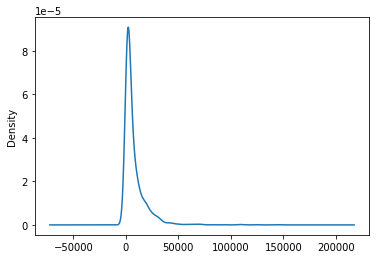

In [116]:
df_twitter.favorite_count.plot(kind = 'density')

- The above visualization dipicts that the favorite_count does not have a normal distribution. the distribution is skewed towards right. Therefore it is positively skewed

#### Distribution of the retweet_count

<AxesSubplot:ylabel='Density'>

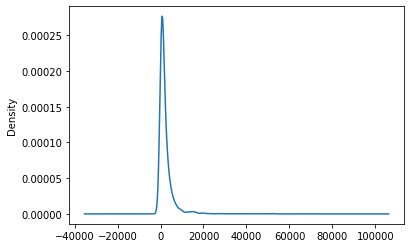

In [117]:
df_twitter.retweet_count.plot(kind = 'density')

- The above visualization dipicts that the retweet_count does not have a normal distribution. the distribution is skewed towards right. Therefore it is positively skewed

#### Distribution of the rating_numerator

In [118]:
df_twitter.rating_numerator.describe()

count    2059.000000
mean       13.085964
std        48.020615
min         0.000000
25%        10.000000
50%        11.000000
75%        12.000000
max      1776.000000
Name: rating_numerator, dtype: float64

<AxesSubplot:ylabel='Density'>

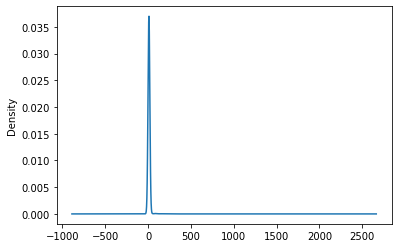

In [119]:
df_twitter.rating_numerator.plot(kind = 'density')

The above visualization dipicts that the rating_numerator does not have a normal distribution. The distribution is skewed towards right. Therefore it is positively skewed.

<AxesSubplot:ylabel='source'>

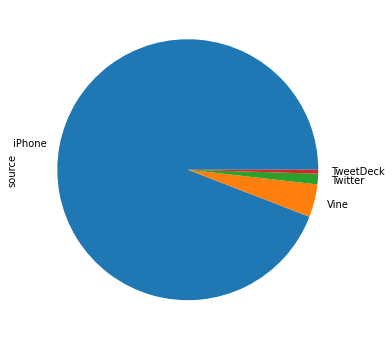

In [120]:
df_twitter.source.value_counts().plot(kind = 'pie', figsize = (10, 6))

The above visualization shows that the iPhone has the most sources, followed by the vine, with Twitter coming in third and TweetDeck having the fewest.

Text(0, 0.5, 'No of Retweet')

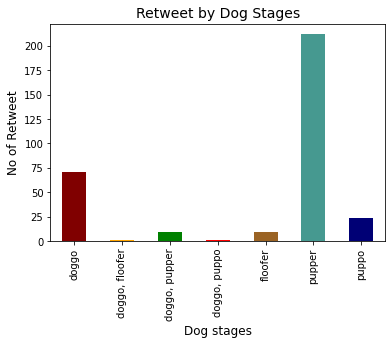

In [121]:
df_twitter.groupby('dog_stage')['retweet_count'].count().plot(kind = 'bar', color = ['#800000','orange','green','red','#9A6324', '#469990', '#000075'])
plt.title('Retweet by Dog Stages', fontsize = 14)
plt.xlabel('Dog stages', fontsize = 12)
plt.ylabel('No of Retweet', fontsize = 12)

As proved from the above visualization, the Pupper Dog stage is the most popular dog stage, as it has the highest number of tweets with a 231 retweets count, followed by Doggo with a 78 retweets count and Puppo with a 29 retweets count, while Floofer has a 9 retweets count. The doggo, pupper hybrid has a 10 retweet count, making it number 4 in the list of the most popular dog stages, while the doggo, floofer hybrid, only has 1 retweet count, and the doggo, puppo also has 1 retweet count.

### Dog Stage Analysis as Related to Retweets

In [122]:
round(df_twitter.groupby('dog_stage')['retweet_count'].mean())

dog_stage
doggo              5416.0
doggo, floofer     2797.0
doggo, pupper      3411.0
doggo, puppo      16148.0
floofer            3343.0
pupper             1967.0
puppo              5204.0
Name: retweet_count, dtype: float64

In [123]:
round(df_twitter.groupby('dog_stage')['retweet_count'].median())

dog_stage
doggo              2316.0
doggo, floofer     2797.0
doggo, pupper      2071.0
doggo, puppo      16148.0
floofer            2053.0
pupper             1004.0
puppo              2525.0
Name: retweet_count, dtype: float64

- The above analysis shows that pupper, which is the most popular dog stage, has the lowest average number of retweets as far as the mean and median are concerned, but the <b>doggo, puppo</b>  dog stage, which only have 1 tweet, has the highest average number of retweets as far as the mean and median are concerned. looking at the distribution of the dog stages we can see that the distribution is not evenly distributed(positively skeweed) showing that retweets have higher inputs at the end. in this case, the median will be more accurate to measure the central tendency as compared to the mean in the presence of the extreme values. Therefore, it would be safe to say that the <b>doggo, puppo</b> dog stage has the highest average number of retweets compared to other dog stages.

Text(0, 0.5, 'No of Retweet')

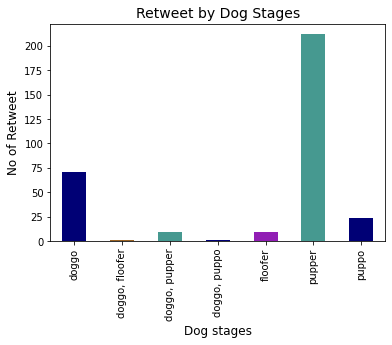

In [124]:
df_twitter.groupby('dog_stage')['favorite_count'].count().plot(kind = 'bar', color = ['#000075', '#9A6324', '#469990', '#000075', '#911eb4', '#469990', '#000075'])
plt.title('Retweet by Dog Stages', fontsize = 14)
plt.xlabel('Dog stages', fontsize = 12)
plt.ylabel('No of Retweet', fontsize = 12)

The above visualization is similar to the retweets_count visualization. demonstrating a strong relationship between likes and the most popular dog stage.

### Dog Stage Analysis as Related to Favorite Count

In [125]:
round(df_twitter.groupby('dog_stage')['favorite_count'].mean())

dog_stage
doggo             16032.0
doggo, floofer    14847.0
doggo, pupper     11810.0
doggo, puppo      41934.0
floofer            9409.0
pupper             6128.0
puppo             18800.0
Name: favorite_count, dtype: float64

In [126]:
round(df_twitter.groupby('dog_stage')['favorite_count'].median())

dog_stage
doggo              9896.0
doggo, floofer    14847.0
doggo, pupper      7469.0
doggo, puppo      41934.0
floofer            5107.0
pupper             2850.0
puppo             11538.0
Name: favorite_count, dtype: float64

- The above analysis shows that pupper, which is the most popular dog stage, has the lowest average number of likes as far as the mean and median are concerned, but the puppo dog stage, which is the third most popular dog stage in terms of tweets, has the highest average number of likes as far as the mean is concerned. While <b>doggo, puppo</b> has the highest average number of likes as far as the median is concerned. Looking at the distribution of the dog stages, we can see that the distribution is not evenly distributed (positively skew, showing that likes have higher inputs at the end). In this case, the median will be more accurate to measure the central tendency as compared to the mean in the presence of the extreme values. Therefore, it would be safe to say that the <b>doggo, puppo</b> dog stage has the highest average number of likes compared to other dog stages.

Text(0, 0.5, 'favorite_count')

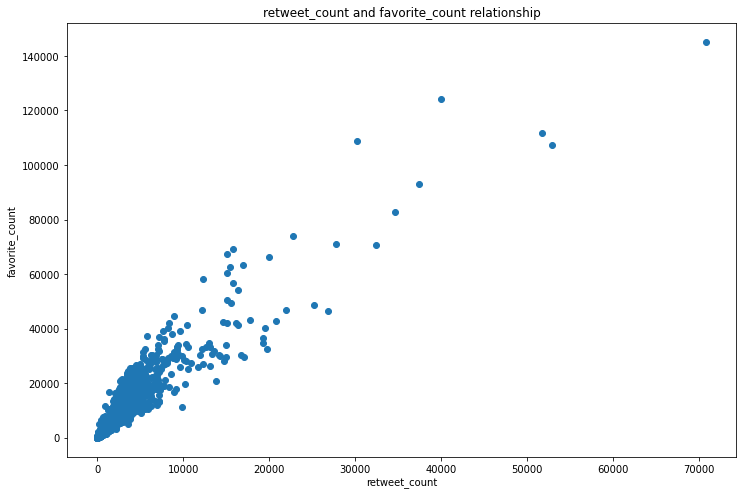

In [127]:
plt.figure(figsize=(12, 8))
plt.scatter(x = df_twitter['retweet_count'], y = df_twitter['favorite_count'])
plt.title('retweet_count and favorite_count relationship')
plt.xlabel('retweet_count')
plt.ylabel('favorite_count')


There is a strong positive correlation between favourite and retweet, i.e linear relationshipbetween the retweet counts and the favorite counts.

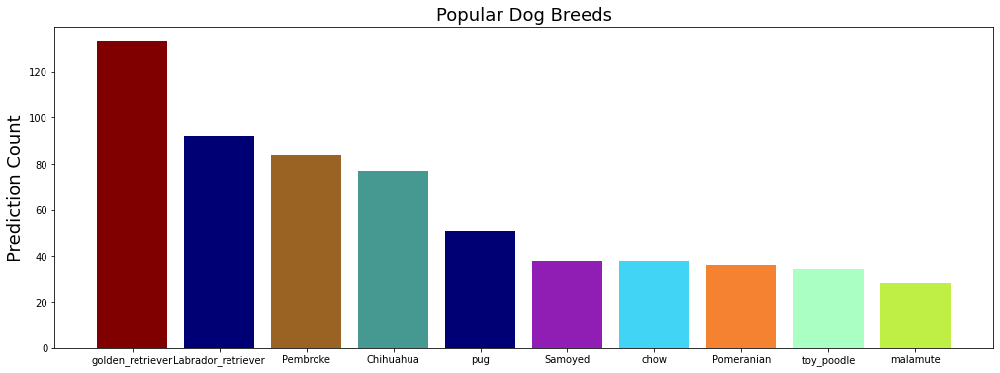

In [128]:
plt.figure(figsize = (17,6))
plt.bar(df_twitter['first_prediction'].value_counts()[0:10].index, df_twitter['first_prediction'].value_counts()[0:10], 
        color = ['#800000', '#000075', '#9A6324', '#469990', '#000075', '#911eb4', '#42d4f4', 
                 '#f58231', '#aaffc3', '#bfef45'])

plt.ylabel("Prediction Count",fontsize = 18);
plt.title("Popular Dog Breeds",fontsize = 18);

###   5 Top Most Favourite dog breed

In [129]:
Favorite_dogbreed = df_twitter.loc[:,['favorite_count','jpg_url','rating_numerator','first_prediction']]

In [130]:
Favorite_dogbreed.drop_duplicates()

,favorite_count,jpg_url,rating_numerator,first_prediction
0,33835.0,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,13.0,orange
1,29348.0,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,13.0,Chihuahua
2,22069.0,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,12.0,Chihuahua
3,36960.0,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,13.0,paper_towel
4,35338.0,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,12.0,basset
...,...,...,...,...
2054,93.0,https://pbs.twimg.com/media/CT5m4VGWEAAtKc8.jpg,6.0,pug
2055,274.0,https://pbs.twimg.com/media/CT5d9DZXAAALcwe.jpg,10.0,Walker_hound
2056,127.0,https://pbs.twimg.com/media/CT5cN_3WEAAlOoZ.jpg,9.0,Gordon_setter
2057,89.0,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,5.0,miniature_pinscher


In [131]:
Favorite_dogbreed.sort_values(by = 'favorite_count', ascending = False, inplace = True)
sum(Favorite_dogbreed.duplicated())

0

In [132]:
Favorite_dogbreed = Favorite_dogbreed.drop_duplicates()

In [133]:
Favorite_dogbreed.head()

,favorite_count,jpg_url,rating_numerator,first_prediction
838,144990.0,https://pbs.twimg.com/ext_tw_video_thumb/74423...,13.0,Labrador_retriever
341,124187.0,https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg,13.0,Lakeland_terrier
438,111766.0,https://pbs.twimg.com/ext_tw_video_thumb/80710...,13.0,Chihuahua
116,108974.0,https://pbs.twimg.com/media/DAZAUfBXcAAG_Nn.jpg,13.0,French_bulldog
873,107326.0,https://pbs.twimg.com/ext_tw_video_thumb/73923...,13.0,Eskimo_dog


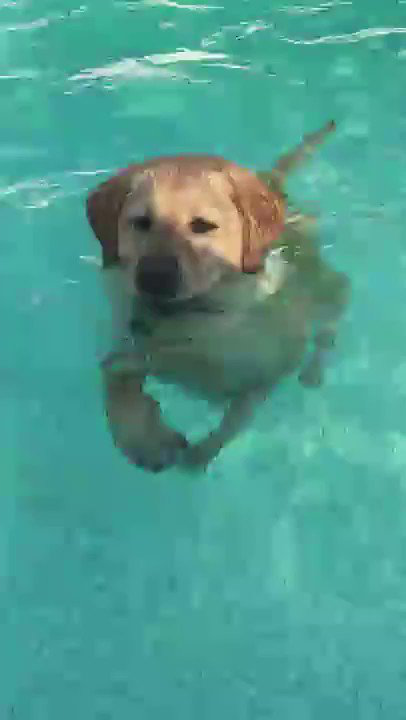

In [135]:
#First Most like
url = Favorite_dogbreed.jpg_url.iloc[0]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [188]:
def dog_breeds(index_no):
    dog_breed = df_twitter[df_twitter.index == index_no]
    dog_breed = dog_breed.loc[:,['name','favorite_count','dog_stage','first_prediction','retweet_count','rating_numerator']]
    dog_breed = dog_breed.T
    return dog_breed

dog_breeds(838)

,838
name,None
favorite_count,144990.0
dog_stage,doggo
first_prediction,Labrador_retriever
retweet_count,70804.0
rating_numerator,13.0


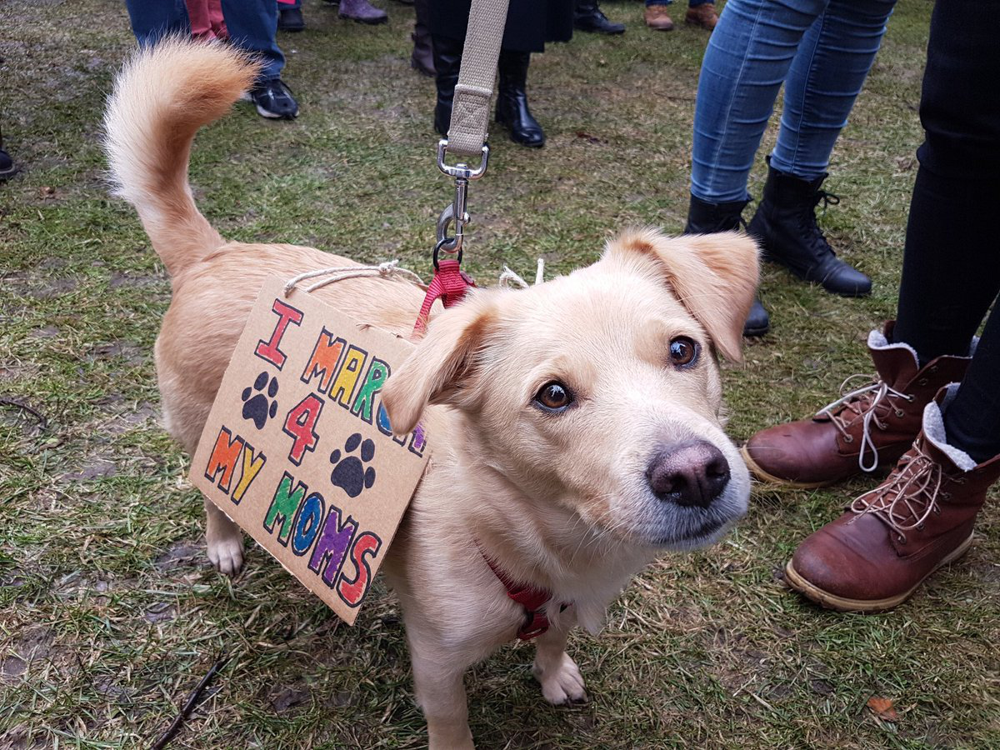

In [137]:
#Second Most like
url = Favorite_dogbreed.jpg_url.iloc[1]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [189]:
dog_breeds(341)

,341
name,None
favorite_count,124187.0
dog_stage,puppo
first_prediction,Lakeland_terrier
retweet_count,39955.0
rating_numerator,13.0


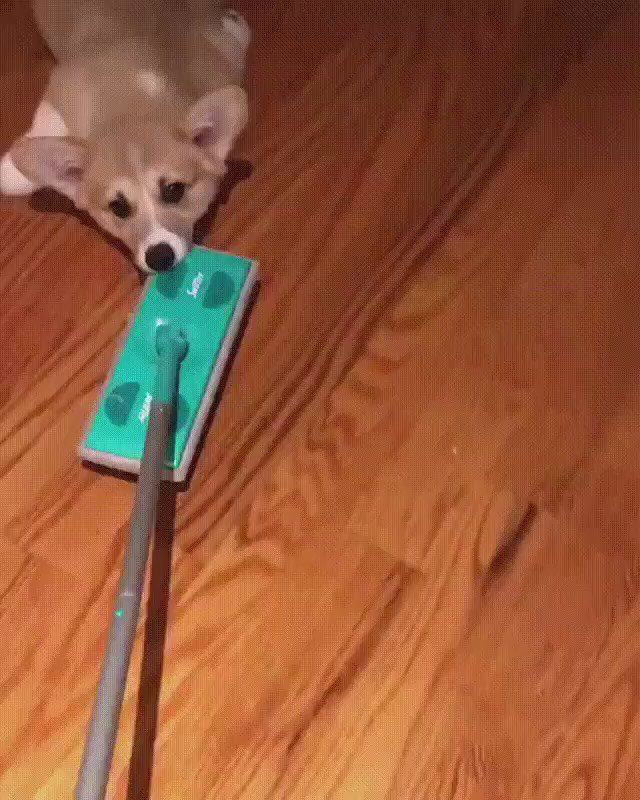

In [139]:
#Third Most like
url = Favorite_dogbreed.jpg_url.iloc[2]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [190]:
dog_breeds(438)

,438
name,Stephan
favorite_count,111766.0
dog_stage,NaN
first_prediction,Chihuahua
retweet_count,51728.0
rating_numerator,13.0


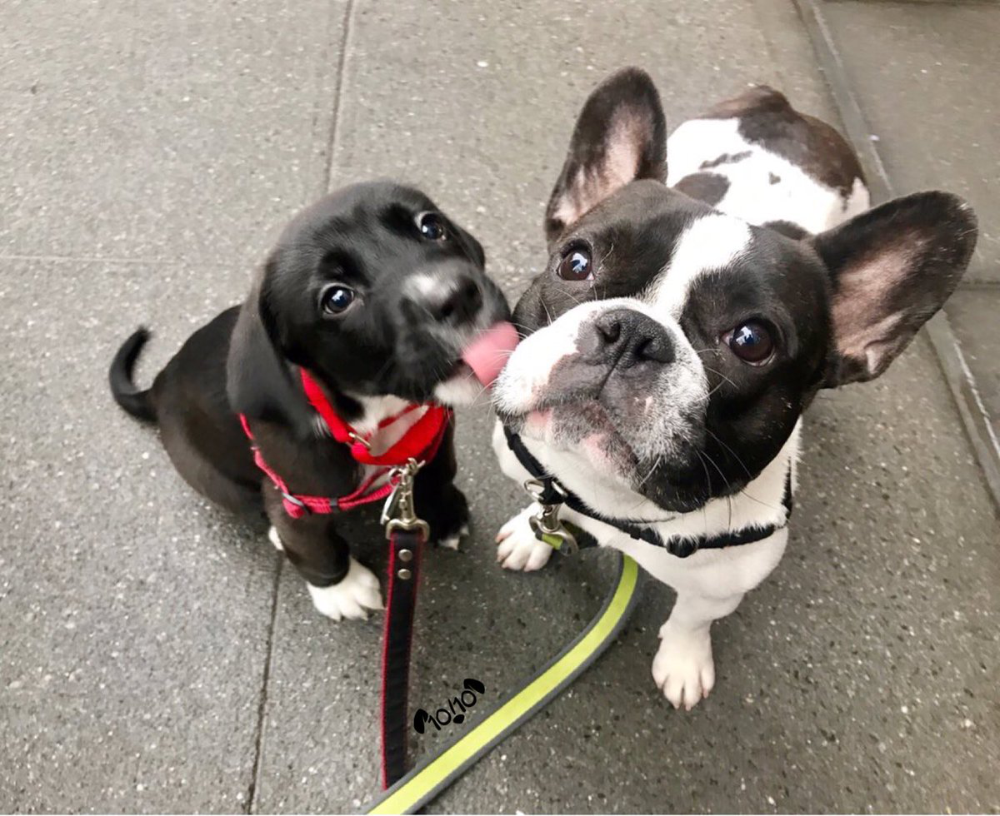

In [141]:
#Fourth Most like
url = Favorite_dogbreed.jpg_url.iloc[3]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [191]:
dog_breeds(116)

,116
name,Jamesy
favorite_count,108974.0
dog_stage,pupper
first_prediction,French_bulldog
retweet_count,30233.0
rating_numerator,13.0


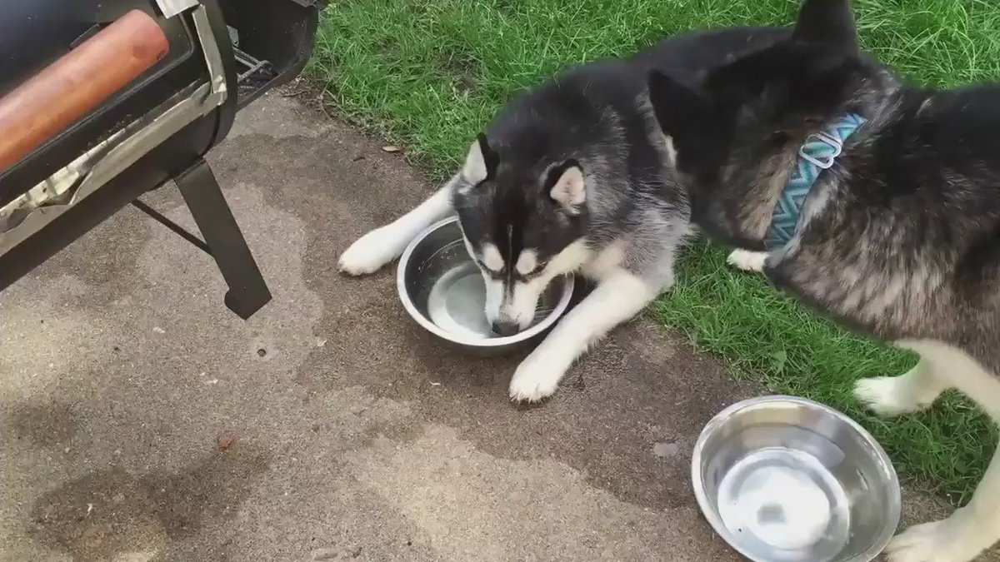

In [143]:
#Fifth Most like
url = Favorite_dogbreed.jpg_url.iloc[4]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [192]:
dog_breeds(873)

,873
name,None
favorite_count,107326.0
dog_stage,doggo
first_prediction,Eskimo_dog
retweet_count,52947.0
rating_numerator,13.0


- From the above dog breed images and their details, we can deduce that the first top dog, 'Labrador Retrieval', has the highest retweeted rate with 70804, while the last most liked dog, 'Eskimo Dog', has the second most retweeted rate with 52947, followed by 'Chihuahua', which has a 51728 retweeted rate, and 'Lakeland_terrier', which is the second most liked dog, has a retweeted rate of 39955

###   Dog with Most Retweet

In [145]:
topRetwt_dogbreed = df_twitter.loc[:,['retweet_count','jpg_url','rating_numerator','first_prediction']]

In [146]:
topRetwt_dogbreed.drop_duplicates()

,retweet_count,jpg_url,rating_numerator,first_prediction
0,7015.0,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,13.0,orange
1,5302.0,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,13.0,Chihuahua
2,3484.0,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,12.0,Chihuahua
3,7229.0,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,13.0,paper_towel
4,7768.0,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,12.0,basset
...,...,...,...,...
2054,37.0,https://pbs.twimg.com/media/CT5m4VGWEAAtKc8.jpg,6.0,pug
2055,132.0,https://pbs.twimg.com/media/CT5d9DZXAAALcwe.jpg,10.0,Walker_hound
2056,51.0,https://pbs.twimg.com/media/CT5cN_3WEAAlOoZ.jpg,9.0,Gordon_setter
2057,37.0,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,5.0,miniature_pinscher


In [147]:
topRetwt_dogbreed.sort_values(by = 'retweet_count', ascending = False, inplace = True)
sum(topRetwt_dogbreed.duplicated())

1

In [148]:
topRetwt_dogbreed = topRetwt_dogbreed.drop_duplicates()

In [149]:
topRetwt_dogbreed.head()

,retweet_count,jpg_url,rating_numerator,first_prediction
838,70804.0,https://pbs.twimg.com/ext_tw_video_thumb/74423...,13.0,Labrador_retriever
873,52947.0,https://pbs.twimg.com/ext_tw_video_thumb/73923...,13.0,Eskimo_dog
438,51728.0,https://pbs.twimg.com/ext_tw_video_thumb/80710...,13.0,Chihuahua
341,39955.0,https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg,13.0,Lakeland_terrier
61,37470.0,https://pbs.twimg.com/ext_tw_video_thumb/87941...,13.0,English_springer


- The above table affirmed that Labrador_retriever, which has the highest number of likes, is the most retweeted dog breed with a retweeted count of 70804. While the last 5 top most liked dogs, 'Eskimo Dog' has the second most retweeted rate with 52947, followed by 'Chihuahua', which has a 51728 retweeted rate, and 'Lakeland_terrier', which is the second most liked dog, has 39955, making it number 4 of the most retweeted dog breeds, while English_springer, which is not part of the top 5 most liked dogs, is the last of the top 5 most retweeted dog breeds. The picture of the English springer is shown below.

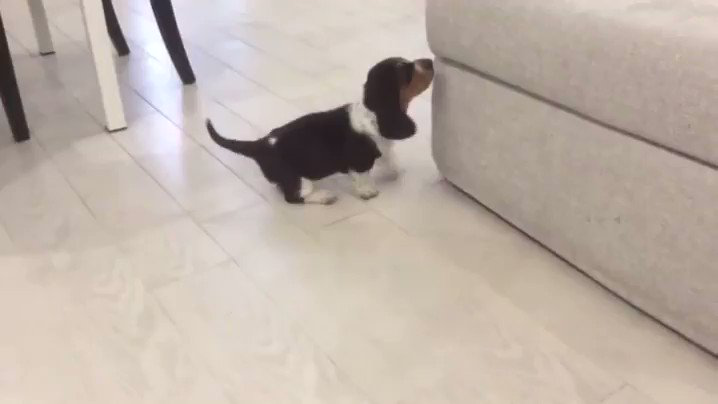

In [150]:
url = topRetwt_dogbreed.jpg_url.iloc[4]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [151]:
dog_breeds(6)

,6
name,Jax
favorite_count,10372.0
dog_stage,NaN
first_prediction,Appenzeller
retweet_count,1667.0
rating_numerator,13.0


#### Dog with Lowest Rating

In [152]:
lowest_rating = df_twitter[df_twitter['rating_numerator'] < 10 ]
len(lowest_rating)

394

In [153]:
sum(lowest_rating.duplicated())

0

In [154]:
lowest_rating.drop_duplicates(inplace = True)

In [155]:
lowest_rating = lowest_rating.loc[:,['retweet_count','jpg_url','rating_numerator','first_prediction']]
lowest_rating

,retweet_count,jpg_url,rating_numerator,first_prediction
41,8277.0,https://pbs.twimg.com/media/DELC9dZXUAADqUk.jpg,5.0,golden_retriever
192,2721.0,https://pbs.twimg.com/media/C8V0aI5V0AAgO9m.jpg,6.0,Bedlington_terrier
260,2765.0,https://pbs.twimg.com/media/C5cOtWVWMAEjO5p.jpg,0.0,swing
319,230.0,NaN,7.0,NaN
581,2529.0,https://pbs.twimg.com/media/CtkFS72WcAAiUrs.jpg,5.0,Pembroke
...,...,...,...,...
2053,63.0,https://pbs.twimg.com/media/CT5w9gUW4AAsBNN.jpg,9.0,bloodhound
2054,37.0,https://pbs.twimg.com/media/CT5m4VGWEAAtKc8.jpg,6.0,pug
2056,51.0,https://pbs.twimg.com/media/CT5cN_3WEAAlOoZ.jpg,9.0,Gordon_setter
2057,37.0,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,5.0,miniature_pinscher


In [156]:
sum(lowest_rating.duplicated())

0

In [157]:
lowest_rating.drop_duplicates(inplace = True)

In [158]:
lowest_rating.sort_values(by = 'rating_numerator' , ascending = False, inplace = True)

In [159]:
lowest_rating.head()

,retweet_count,jpg_url,rating_numerator,first_prediction
1799,133.0,https://pbs.twimg.com/media/CVEkZaPXIAEw5vr.jpg,9.0,Italian_greyhound
1307,1046.0,https://pbs.twimg.com/media/CZLwGAIWQAIYsTx.jpg,9.0,Old_English_sheepdog
1316,1005.0,https://pbs.twimg.com/media/CZDT-mZWsAEK9BH.jpg,9.0,Scotch_terrier
1320,900.0,https://pbs.twimg.com/media/CZBeMMVUwAEdVqI.jpg,9.0,cocker_spaniel
1762,1010.0,https://pbs.twimg.com/media/CVQnPMrVAAAzShR.jpg,9.0,carton


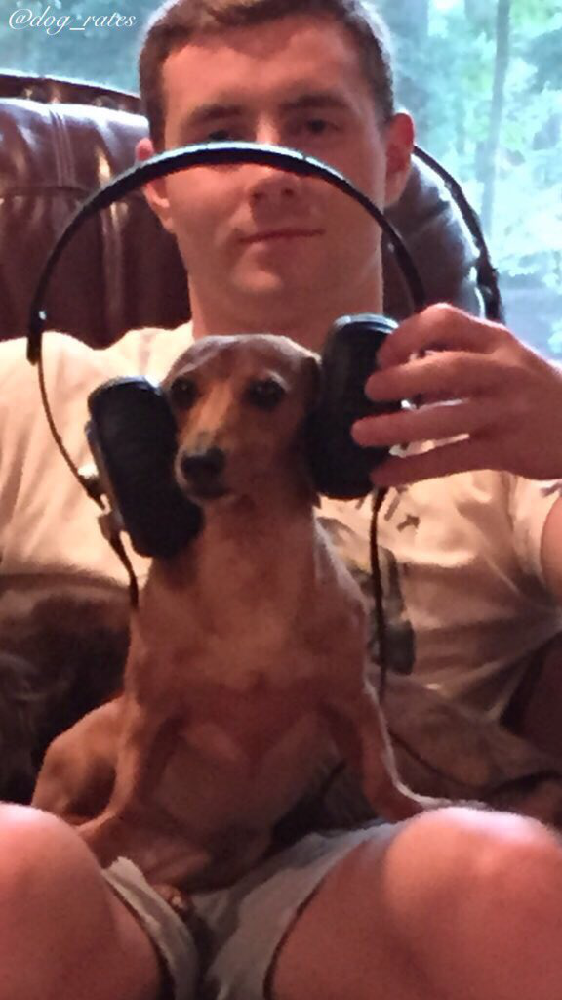

In [160]:
url = lowest_rating.jpg_url.iloc[0]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [176]:
dog_breeds(1799)

,1799
name,None
favorite_count,351.0
dog_stage,NaN
first_prediction,Italian_greyhound
retweet_count,133.0
rating_numerator,9.0


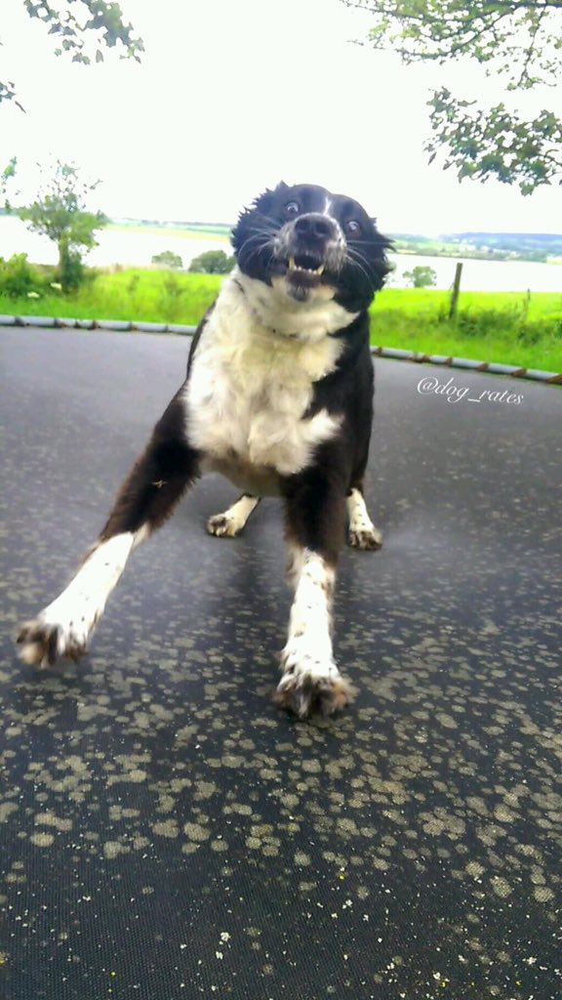

In [181]:
url = lowest_rating.jpg_url.iloc[1]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [177]:
dog_breeds(1307)

,1307
name,Durg
favorite_count,2808.0
dog_stage,NaN
first_prediction,Old_English_sheepdog
retweet_count,1046.0
rating_numerator,9.0


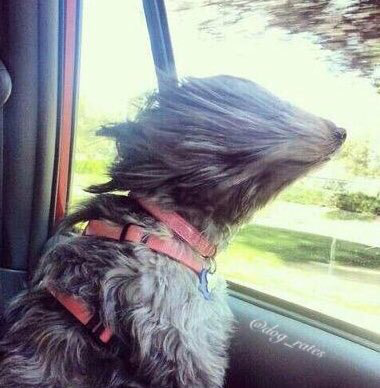

In [182]:
url = lowest_rating.jpg_url.iloc[2]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [178]:
dog_breeds(1316)

,1316
name,Chipson
favorite_count,3026.0
dog_stage,NaN
first_prediction,Scotch_terrier
retweet_count,1005.0
rating_numerator,9.0


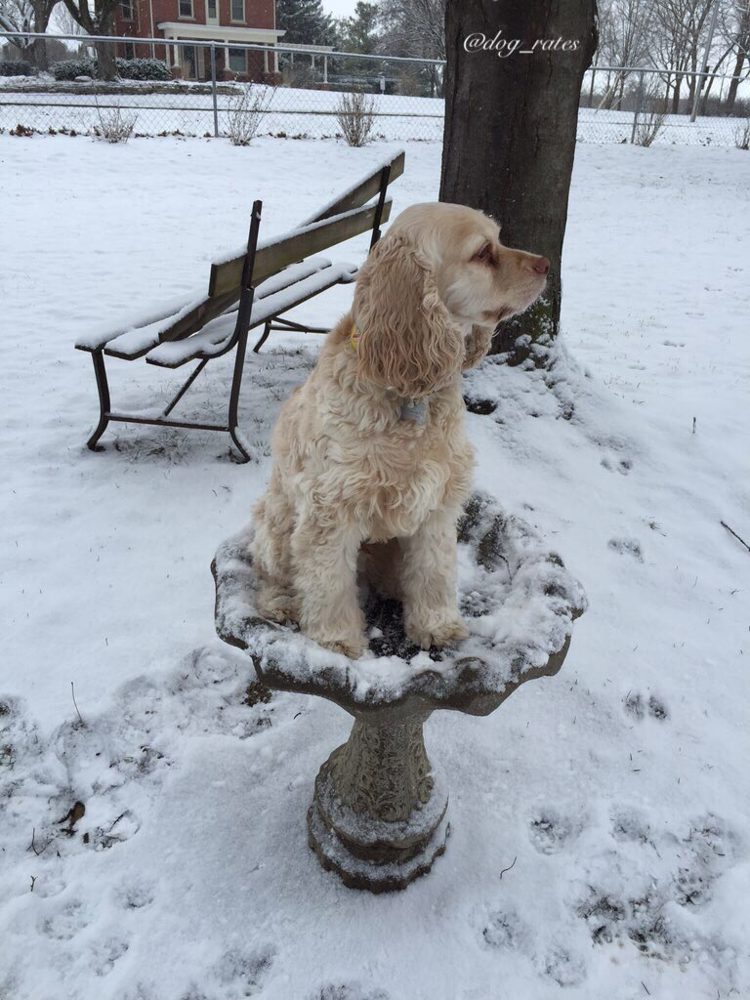

In [183]:
url = lowest_rating.jpg_url.iloc[3]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [186]:
dog_breeds(1320)

,1320
name,None
favorite_count,2865.0
dog_stage,NaN
first_prediction,cocker_spaniel
retweet_count,900.0
rating_numerator,9.0


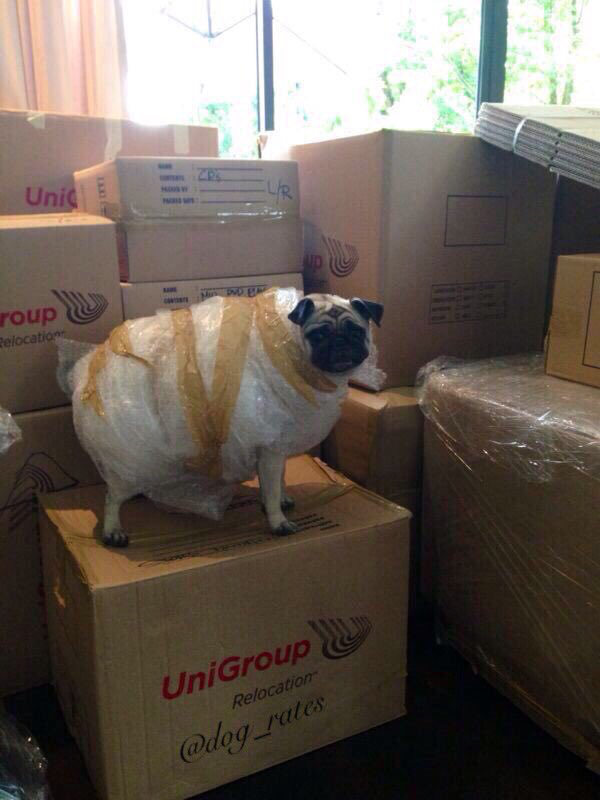

In [185]:
url = lowest_rating.jpg_url.iloc[4]
r = requests.get(url)
Image.open(BytesIO(r.content))

In [187]:
dog_breeds(1762)

,1762
name,Opal
favorite_count,1996.0
dog_stage,pupper
first_prediction,carton
retweet_count,1010.0
rating_numerator,9.0


The least rated dogs were not sorted ascendingly because there are values that are not dog breeds towards the end of the first prediction column. One thing that is worthy of noticing is that the likes and retweets do not have any relationship with the rating. If we look at the ratings, we will see that the first 4 dog breeds brought out all have 9 as their rating number.